In [3]:
import xarray as xr
import xroms
import matplotlib.pyplot as plt
import cartopy
import numpy as np
import hvplot.xarray
import geoviews as gv
import cmocean.cm as cmo
import xcmocean

# How to plot

This notebook demonstrates how to plot ROMS model output from a planview ($x$-$y$) and an $x$-$z$ cross-section. Static and interactive approaches are shown. The `cartopy` package is used for managing projections for mapview plots, which also gives many options for input (some shown below).

Note you need version 0.11 of Datashader for rasterizing to work in the interactive plots. (https://github.com/holoviz/hvplot/issues/434)

### Load in data

More information at in [load_data notebook](load_data.ipynb)

In [4]:
# Helpful to have local file for this
url = 'http://barataria.tamu.edu:8080/thredds/fileServer/forecast_latest/txla2_his_a_latest.nc'
fname = url.split('/')[-1]
chunks = {'ocean_time': 1}

import os
if os.path.exists(fname):
    ds = xroms.open_netcdf(fname, chunks=chunks)
else:
    from subprocess import call
    call(['wget', url])
    ds = xroms.open_netcdf(fname, chunks=chunks)
    
# Alternatively, use file through thredds:
# loc = 'http://barataria.tamu.edu:8080/thredds/dodsC/forecast_latest/txla2_his_f_latest.nc'
# chunks = {'ocean_time':1}
# ds = xr.open_dataset(loc, chunks=chunks)

## Setup for plotting

Use `cartopy` when plotting with a projection and/or wanting to add context like coastline.

In [5]:
proj = cartopy.crs.LambertConformal(central_longitude=-98, central_latitude=30)
pc = cartopy.crs.PlateCarree()

## Using `cf-xarray` with plots

As described in the [select data notebook](../example/select_data.ipynb), xroms is built to use the cf-xarray accessor to make working with dimensions more easy.

See description of a DataArray with
> ds.salt.cf.describe()

    which returns
    
```
Axes:
	X: ['xi_rho']
	Y: ['eta_rho']
	Z: ['s_rho']
	T: ['ocean_time']
Coordinates:
	longitude: ['lon_rho']
	latitude: ['lat_rho']
	vertical: ['z_rho']
	time: ['ocean_time']
Cell Measures:
	area: []
	volume: []
Standard Names:
	unsupported
```

From this you know that you can use the `cf-xarray` accessor to call many typical `xarray` functions from your Dataset or DataArray by substituting the generic Axes names (X, Y, Z, or T) in place of the specific dimension name on the right side of the Axes description. For example:

> ds.salt.cf.sel(X=20, T='2010-1-1')

instead of

> ds.salt.sel(xi_rho=20, ocean_time='2010-1-1')

A similar syntax works for `isel` commands.

You also know from this description that calls that take in coordinates for `xarray` can be used with their generic coordinate name listed above (longitude, latitude, vertical, time). For example:

> ds.salt.cf.plot(x='longitude', y='latitude')

instead of

> ds.salt.plot(x='lon_rho', y='lat_rho')

We use these shorter generalized Axes and Coordinates below.

## `xcmocean` for choosing colormaps

The `xcmocean` accessor can be used when plotting with `xarray` to automatically choose a "good" colormap for the plot based on the DataArray name and attributes and colormaps from the [`cmocean` colormaps package](https://matplotlib.org/cmocean/).

To use the colormap accessor, add `.cmo` before the plot call from xarray (but skip the `plot` if specifying the type of plot subsequently, like `pcolormesh`). These are the call options:

* `cmo.plot()`
* `cmo.pcolormesh()` to specify `pcolormesh`
* `cmo.contourf()` to specify `contourf`
* `cmo.contour()` to specify `contour`

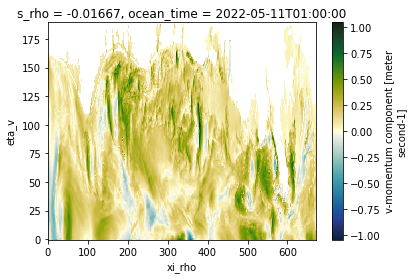

In [6]:
ds.v.cf.isel(T=0, Z=-1).cmo.pcolormesh()

`xcmocean` can also be used in conjunction with `cf-xarray` but with slightly different syntax. You can access the same plot options while using `cf-xarray` in the plot call with the following:

* `cmo.cfplot()`
* `cmo.cfpcolormesh()`
* `cmo.cfcontourf()`
* `cmo.cfcontour()`

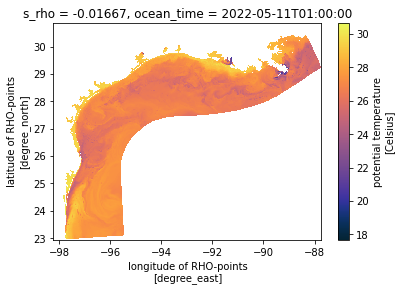

In [7]:
ds.temp.cf.isel(T=0, Z=-1).cmo.cfpcolormesh(x='longitude', y='latitude')

## Static: `xarray`

Can plot directly in `xarray` since it has wrapped many `Matplotlib` plotting routines. This is great for quick plots and continues to improve, but if you need more control then try the next section of plotting directly in `Matplotlib`.

### map view

#### Overview

Plotted with dimension indices instead of coordinates:

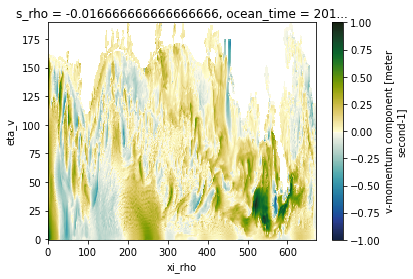

In [8]:
ds.v.cf.isel(T=0, Z=-1).plot(cmap=cmo.delta)

Plotted with coordinates lon/lat:

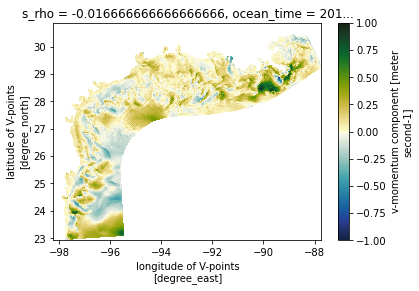

In [5]:
ds.v.cf.isel(T=0, Z=-1).cf.plot(x='longitude', y='latitude', cmap=cmo.delta)

#### magnified

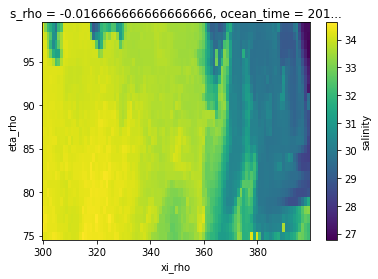

In [6]:
ds.salt.cf.isel(T=0, Z=-1, X=slice(300,400), Y=slice(75,100)).plot()

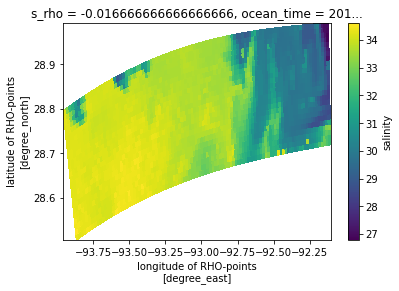

In [7]:
ds.salt.cf.isel(T=0, Z=-1, X=slice(300,400), Y=slice(75,100)).cf.plot(x='longitude', y='latitude')

### cross-section

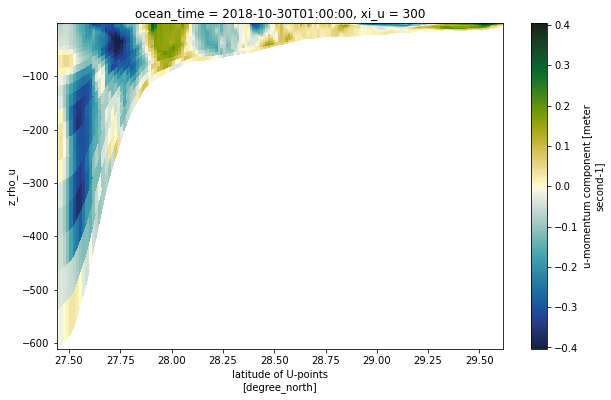

In [8]:
dss = ds.u.cf.isel(X=300, T=0)
dss.where(~dss.isnull(), drop=True).cf.plot(x='latitude', y='vertical', cmap=cmo.delta, figsize=(10,6))

## Static: `Matplotlib`

### map view

#### Overview

Here is a basic plan-view map, using `cartopy` for projection handling. You can add many different types of natural data for context. Shown here are coastline, land, rivers, and state borders. You can control the resolution of the data by changing the input to `with_scale` (options are '10m', '50m', or '110m', corresponding to 1:10,000,000, 1:50,000,000, and 1:110,000,000 scale). More `cartopy` feature information available here: https://scitools.org.uk/cartopy/docs/v0.16/matplotlib/feature_interface.html.

/Users/kthyng/opt/miniconda3/envs/env/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


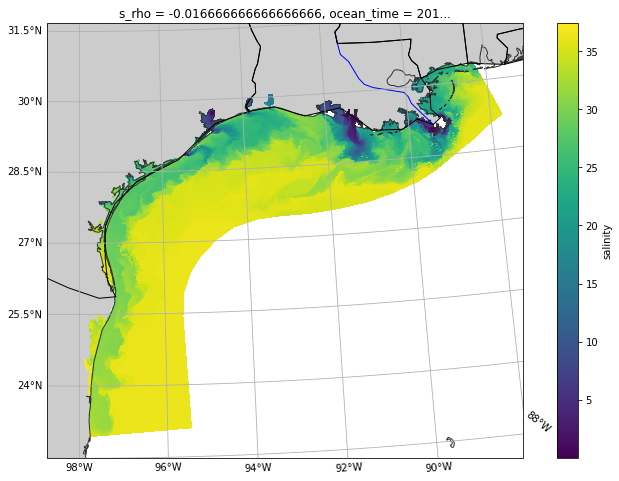

In [9]:
fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=proj)

# Add natural features
ax.add_feature(cartopy.feature.LAND.with_scale('110m'), facecolor='0.8')
ax.add_feature(cartopy.feature.COASTLINE.with_scale('10m'), edgecolor='0.2')
ax.add_feature(cartopy.feature.RIVERS.with_scale('110m'), edgecolor='b')
ax.add_feature(cartopy.feature.STATES.with_scale('110m'), edgecolor='k')

gl = ax.gridlines(draw_labels=True, x_inline=False, y_inline=False, xlocs=np.arange(-104,-80,2))

# manipulate `gridliner` object to change locations of labels
gl.top_labels = False
gl.right_labels = False

ds.salt.cf.isel(T=0, Z=-1).cf.plot(ax=ax, x='longitude', y='latitude', transform=pc)

#### Magnified

Use `set_extent` to narrow the view to magnify a subregion.

/Users/kthyng/opt/miniconda3/envs/env/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


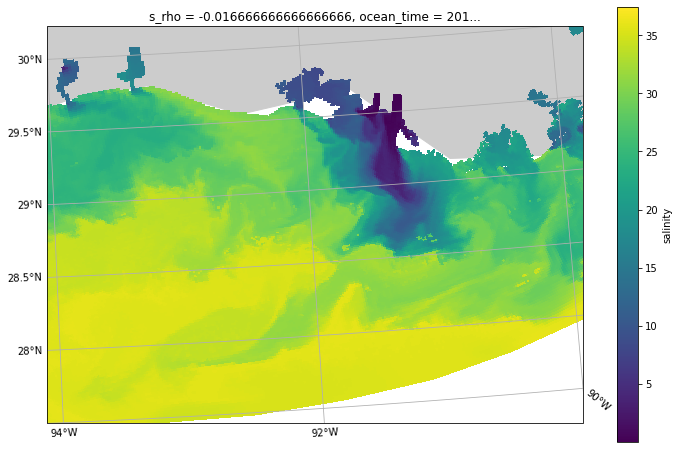

In [10]:
fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=proj)

ax.set_extent([-94, -90, 27.5, 30], crs=pc)
ax.add_feature(cartopy.feature.LAND.with_scale('110m'), facecolor='0.8')
gl = ax.gridlines(draw_labels=True, x_inline=False, y_inline=False, xlocs=np.arange(-104,-80,2))

# manipulate `gridliner` object to change locations of labels
gl.top_labels = False
gl.right_labels = False

ds.salt.cf.isel(T=0, Z=-1).cf.plot(ax=ax, x='longitude', y='latitude', transform=pc)

### cross-section

This is the same as the example above for plotting directly from `xarray` since projections on plan-view maps make most of the difference.

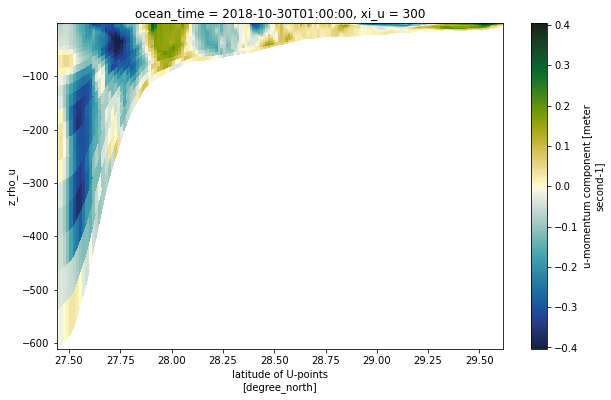

In [21]:
dss = ds.u.cf.isel(X=300, T=0)
dss.where(~dss.isnull(), drop=True).cf.plot(x='latitude', y='vertical', cmap=cmo.delta, figsize=(10,6))

## Interactive

In these interactive plots, you can zoom, pan, and save plots using the menu on the right-hand side. There is a mouse hover option to display specific values; this can also be turned off. The plot automatically makes a widget to the right of the plot to easily vary over that variable. Currently the plots below are set to vary over time.

### map view

The tiles allow for different basemap options. The `rasterize` option is really important here by allowing a lower resolution presentation when zoomed out and increasing resolution with magnification, potentially saving a lot of time.

#### Vary over time (for surface)

In [15]:
tiles = gv.tile_sources.ESRI  # optional, for a basemap
ds.salt.cf.isel(s_rho=-1).hvplot.quadmesh(x='lon_rho', y='lat_rho', width=650, height=500,
                        cmap=cmo.haline, rasterize=True, crs=pc) * tiles

:DynamicMap   [ocean_time]
   :Overlay
      .Image.I :Image   [lon_rho,lat_rho]   (salt)
      .WMTS.I  :WMTS   [Longitude,Latitude]

#### Vary over sigma level and time

In [13]:
tiles = gv.tile_sources.ESRI  # optional, for a basemap
ds.salt.hvplot.quadmesh(x='lon_rho', y='lat_rho', width=650, height=500,
                        cmap=cmo.haline, rasterize=True, crs=pc) * tiles

:DynamicMap   [ocean_time,s_rho]
   :Overlay
      .Image.I :Image   [lon_rho,lat_rho]   (salt)
      .WMTS.I  :WMTS   [Longitude,Latitude]

#### Vary over depth and time

Since the vertical dimension is in sigma coordinates instead of fixed depths, it is not immediate to be able to use a widget to vary depth in these plots. However, it is still possible to do using `xroms` code. First set up the calculation for several depths you want to examine using `xroms.isoslice`, then send that `xarray` object to `hvplot` for plotting. It is slow because it has to calculate everything, but it is nevertheless interactive. Having these files locally would speed it up.

In the following example, we use the accessor version of the isoslice interpolation to find slices of salinity at fixed depths. To save some time, we use the time-constant depths (`z_rho0`) associated with salinity instead of the time-varying version (`z_rho`).

In [14]:
zsalt = ds.salt.xroms.isoslice([-10, -20, -30], iso_array=ds.salt.z_rho0, axis='Z')

In [15]:
tiles = gv.tile_sources.ESRI  # optional, for a basemap
zsalt.hvplot.quadmesh(x='lon_rho', y='lat_rho', width=650, height=500,
                        cmap=cmo.haline, rasterize=True, crs=pc) * tiles

:DynamicMap   [z_rho0,ocean_time]
   :Overlay
      .Image.I :Image   [lon_rho,lat_rho]   (salt)
      .WMTS.I  :WMTS   [Longitude,Latitude]

### cross-section

In this case, the plots are similar whether `rasterize=True` is used or not.

In [16]:
ds.temp.isel(xi_rho=300).hvplot.quadmesh(x='lat_rho', y='z_rho0', width=750, height=400,
                        cmap=cmo.thermal)

:DynamicMap   [ocean_time]
   :QuadMesh   [lat_rho,z_rho0]   (temp)